# NYC Taxi Data Science Project
#### By: Carl Conste

This project uses data collected by the New York City Taxi and Limousine commission about “Green” Taxis. Green Taxis (as opposed to yellow ones) are taxis that are not allowed to pick up passengers inside of the densely populated areas of Manhattan. This project was sourced from Stratascratch, which originally is from Capital One. The data used for this project is from 2015. However, any year could technically be used.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from xgboost import XGBRegressor

import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go
import json

import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

## Question 1

#### Programmatically download and load into your favorite analytical tool the trip data for September 2015. Report how many rows and columns of data you have loaded.

In [2]:
data = pd.read_csv('data/green_tripdata_2015-09.tar.bz2', compression='bz2')

In [3]:
data.shape

(1494926, 21)

Our data has 1,494,926 rows with 21 columns, meaning we have 1.4 million entries, each with 21 features. Let's look further into the features of our data.

In [4]:
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 1494926 entries, 0 to 1494925
Data columns (total 21 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   VendorID               1494926 non-null  int64  
 1   lpep_pickup_datetime   1494926 non-null  str    
 2   Lpep_dropoff_datetime  1494926 non-null  str    
 3   Store_and_fwd_flag     1494926 non-null  str    
 4   RateCodeID             1494926 non-null  int64  
 5   Pickup_longitude       1494926 non-null  float64
 6   Pickup_latitude        1494926 non-null  float64
 7   Dropoff_longitude      1494926 non-null  float64
 8   Dropoff_latitude       1494926 non-null  float64
 9   Passenger_count        1494926 non-null  int64  
 10  Trip_distance          1494926 non-null  float64
 11  Fare_amount            1494926 non-null  float64
 12  Extra                  1494926 non-null  float64
 13  MTA_tax                1494926 non-null  float64
 14  Tip_amount             149492

In [5]:
data.describe()

,VendorID,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
count,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,0.0,1.494926e+06,1.494926e+06,1.494926e+06,1.494922e+06
mean,1.782045e+00,1.097653e+00,-7.383084e+01,4.069114e+01,-7.383728e+01,4.069291e+01,1.370598e+00,2.968141e+00,1.254320e+01,3.512800e-01,4.866408e-01,1.235727e+00,1.231047e-01,NaN,2.920991e-01,1.503215e+01,1.540559e+00,1.022353e+00
std,4.128570e-01,6.359437e-01,2.776082e+00,1.530882e+00,2.677911e+00,1.476698e+00,1.039426e+00,3.076621e+00,1.008278e+01,3.663096e-01,8.504473e-02,2.431476e+00,8.910137e-01,NaN,5.074009e-02,1.155316e+01,5.232935e-01,1.478288e-01
min,1.000000e+00,1.000000e+00,-8.331908e+01,0.000000e+00,-8.342784e+01,0.000000e+00,0.000000e+00,0.000000e+00,-4.750000e+02,-1.000000e+00,-5.000000e-01,-5.000000e+01,-1.529000e+01,NaN,-3.000000e-01,-4.750000e+02,1.000000e+00,1.000000e+00
25%,2.000000e+00,1.000000e+00,-7.395961e+01,4.069895e+01,-7.396782e+01,4.069878e+01,1.000000e+00,1.100000e+00,6.500000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,8.160000e+00,1.000000e+00,1.000000e+00
50%,2.000000e+00,1.000000e+00,-7.394536e+01,4.074674e+01,-7.394504e+01,4.074728e+01,1.000000e+00,1.980000e+00,9.500000e+00,5.000000e-01,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,1.176000e+01,2.000000e+00,1.000000e+00
75%,2.000000e+00,1.000000e+00,-7.391748e+01,4.080255e+01,-7.391013e+01,4.079015e+01,1.000000e+00,3.740000e+00,1.550000e+01,5.000000e-01,5.000000e-01,2.000000e+00,0.000000e+00,NaN,3.000000e-01,1.830000e+01,2.000000e+00,1.000000e+00
max,2.000000e+00,9.900000e+01,0.000000e+00,4.317726e+01,0.000000e+00,4.279934e+01,9.000000e+00,6.031000e+02,5.805000e+02,1.200000e+01,5.000000e-01,3.000000e+02,9.575000e+01,NaN,3.000000e-01,5.813000e+02,5.000000e+00,2.000000e+00


In [6]:
data.columns

Index(['VendorID', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime',
       'Store_and_fwd_flag', 'RateCodeID', 'Pickup_longitude',
       'Pickup_latitude', 'Dropoff_longitude', 'Dropoff_latitude',
       'Passenger_count', 'Trip_distance', 'Fare_amount', 'Extra', 'MTA_tax',
       'Tip_amount', 'Tolls_amount', 'Ehail_fee', 'improvement_surcharge',
       'Total_amount', 'Payment_type', 'Trip_type '],
      dtype='str')

In [7]:
data.head()

,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,...,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
0,2,2015-09-01 00:02:34,2015-09-01 00:02:38,N,5,-73.979485,40.684956,-73.979431,40.685020,1,...,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0
1,2,2015-09-01 00:04:20,2015-09-01 00:04:24,N,5,-74.010796,40.912216,-74.010780,40.912212,1,...,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0
2,2,2015-09-01 00:01:50,2015-09-01 00:04:24,N,1,-73.921410,40.766708,-73.914413,40.764687,1,...,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0
3,2,2015-09-01 00:02:36,2015-09-01 00:06:42,N,1,-73.921387,40.766678,-73.931427,40.771584,1,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0
4,2,2015-09-01 00:00:14,2015-09-01 00:04:20,N,1,-73.955482,40.714046,-73.944412,40.714729,1,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0


First let's drop any columns that won't be useful. For instance, the column ```Ehail_fee``` is all null values, so we can drop it before doing any further analysis.

In [8]:
data.drop(columns='Ehail_fee', inplace=True) # full of nans

## Question 2

#### Plot a histogram of the number of the trip distance (“Trip Distance”). Report any structure you find and any hypotheses you have about that structure

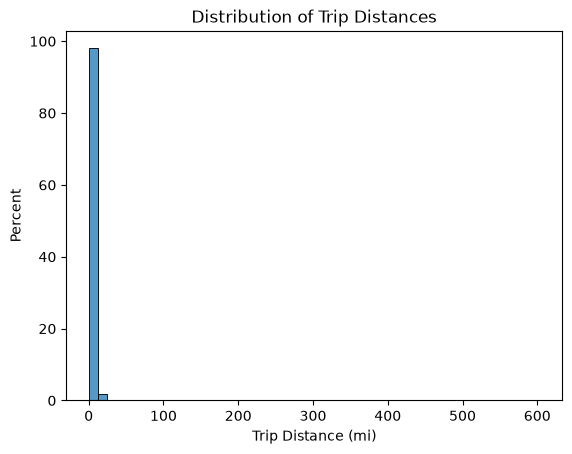

In [9]:
sns.histplot(data=data, x='Trip_distance', bins = 50, stat='percent')
plt.xlabel('Trip Distance (mi)')
plt.title('Distribution of Trip Distances');

Looking at the histogram, we can see most of the trips occured were less than 100 miles. However, some outliers are heavily affecting our histogram. Let's instead look at the distribution of trips under 50 miles and see the difference.

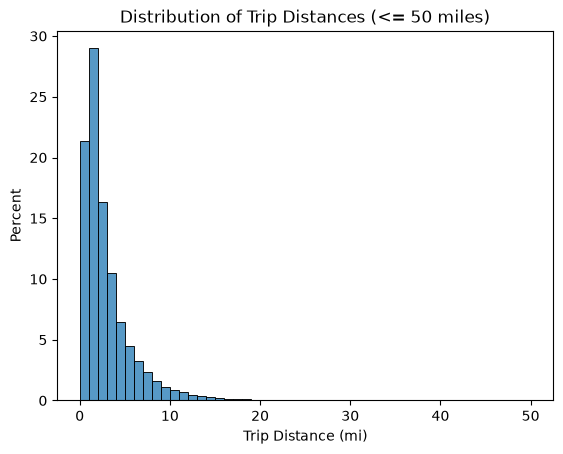

In [10]:
sns.histplot(data[data['Trip_distance'] <= 50], x='Trip_distance', bins = 50, stat='percent')
plt.xlabel('Trip Distance (mi)')
plt.title('Distribution of Trip Distances (<= 50 miles)');

From our histograms, we can see that our data heavily skews right, with most of the trips having a distance of 5 miles or less. Only a couple of trips are greater than 5 miles. One hypothesis for this is that green taxis were used as an alternative to public transportation, potentially in scenarios when public transit was not as convenient such as late at night.

## Question 3

#### a) Report mean and median trip distance grouped by hour of day.

First we'll do some data cleaning, converting the pickup and dropoff times to ```datetime``` format, and then aggregating the mean and median trip distances by hour of day. For the hour of day, I used the pickup hour instead of the dropoff hour. Additionally, I added features such as the ```day_of_week``` and ```is_weekend``` which will be helpful later on in the project.


In [11]:
data['lpep_pickup_datetime'] = pd.to_datetime(data['lpep_pickup_datetime'])
data['Lpep_dropoff_datetime'] = pd.to_datetime(data['Lpep_dropoff_datetime'])

data['hour_of_day'] = data['lpep_pickup_datetime'].dt.hour
data['day_of_week'] = data['lpep_pickup_datetime'].dt.weekday
data['is_weekend'] = data['lpep_pickup_datetime'].dt.weekday >= 5

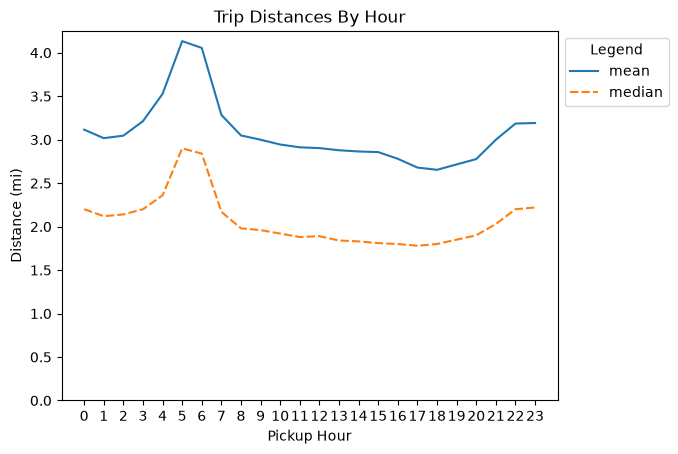

In [12]:
distance_by_hour = data.groupby('hour_of_day')['Trip_distance'].agg(['mean', 'median'])
sns.lineplot(data=distance_by_hour)
plt.xlabel('Pickup Hour')
plt.ylabel('Distance (mi)')
plt.title('Trip Distances By Hour')
plt.legend(title='Legend', loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(np.arange(0, 24))
plt.ylim(bottom=0);

From the graph, it looks like trip distances peaks at around 5-6 am then goes down and remains relatively similar throughout the day until 8pm where it rises again. This could suggest that New Yorkers are using taxis as an alternative to transit during the early morning hours when transit schedules aren't as frequent.

#### b) We’d like to get a rough sense of identifying trips that originate or terminate at one of the NYC area airports. Can you provide a count of how many transactions fit this criteria, the average fare, and any other interesting characteristics of these trips

First, we'll create a helper function to determine if the trip originated or terminated at an airport, which airport (JFK or La Guardia), and wether it was a pickup or dropoff. Coordinates for each airport were obtained via Google Maps.

In [13]:
def airport(row):
    if (-73.799203 <= row['Pickup_longitude'] <= -73.769882 and 40.624041 <= row['Pickup_latitude'] <= 40.667510):
        return True, 'jfk', 'pickup'
    elif (-73.799203 <= row['Dropoff_longitude'] <= -73.769882 and 40.624041 <= row['Dropoff_latitude'] <= 40.667510): 
        return True, 'jfk', 'dropoff'
    elif (-73.878296 <= row['Pickup_longitude'] <= -73.866051 and 40.761776 <= row['Pickup_latitude'] <= 40.782781):
        return True, 'lga', 'pickup'
    elif (-73.878296 <= row['Dropoff_longitude'] <= -73.866051 and 40.761776 <= row['Dropoff_latitude'] <= 40.782781): 
        return True, 'lga', 'dropoff'
    return False, 'none', 'none'

data[['is_airport', 'which_airport', 'type']] = data.apply(airport, axis=1, result_type='expand')

First let's see how many transactions are airport transactions:

In [14]:
airport = data[data['is_airport'] == True]
print(airport.shape[0], (airport.shape[0] / len(data)) * 100)

31347 2.0968930903603256


It looks like there's a total of 31,347 trips originating/terminating at an airport. That's approximately 2% of our trips. Let's look into the average fare between trips to/from the airport and trips that didn't start/end at the airport.

In [15]:
data.groupby('is_airport')[['Fare_amount']].agg(avg_fare_amount=('Fare_amount', 'mean'))

,avg_fare_amount
is_airport,
False,12.219627
True,27.650584


It looks like the average fare amount increases by over 100% if the trip is an airport trip compared to non-airport trips. Let's break it down further and see the differences between JFK and La Guardia trips. First, let's look at the distribution between the two.

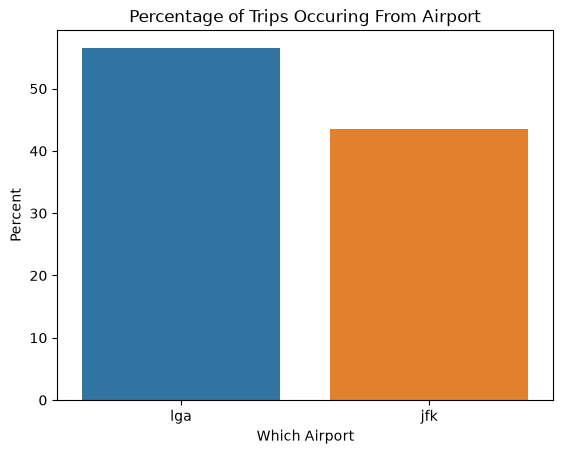

In [16]:
sns.countplot(data=airport, x='which_airport', stat='percent', hue='which_airport')

plt.xlabel('Which Airport')
plt.ylabel('Percent')
plt.title('Percentage of Trips Occuring From Airport');

Out of the 31k airport trips, over 50% of those were to/from La Guardia. This could be because it might be cheaper to fly out of LGA as opposed to JFK because it's not considered a major airport. Additionally, since it's closer to Manhattan than JFK, people may opt to fly to/from LGA instead for convenience. Let's break it down further and see if more trips were pick ups or drop offs.

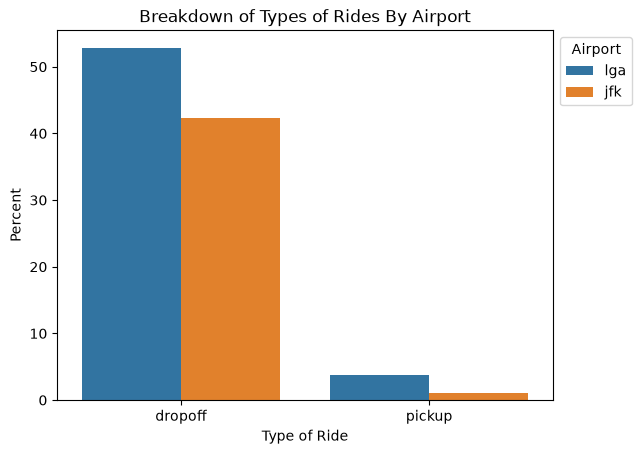

In [17]:
sns.countplot(data=airport, x='type', stat='percent', hue='which_airport')

plt.xlabel('Type of Ride')
plt.ylabel('Percent')
plt.legend(title='Airport', loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Breakdown of Types of Rides By Airport');

It looks like most airport rides are dropoffs rather than pick ups from both airports. This alongside the fact that trip distances peak at early hours of the morning could suggest that residents are relying on taxis in the early morning to make their flights. From this, it can be assumed that they are less price sensitive, and are okay with paying an increased fare. With that, let's compare the average and median fare between airports.

In [18]:
airport.groupby('which_airport')['Fare_amount'].agg(['mean', 'median'])

,mean,median
which_airport,,
jfk,40.506604,42.0
lga,17.761505,13.5


On average, fares are higher from JFK compared to LGA. This could be because JFK is the primary hub for international flights in the Greater NY area. The demographic of those leaving to/from JFK are primarily tourists or vacation-goers, which are less price senstive, leading to higher fares on average. Let's look at the distribution of fares between the two airports.

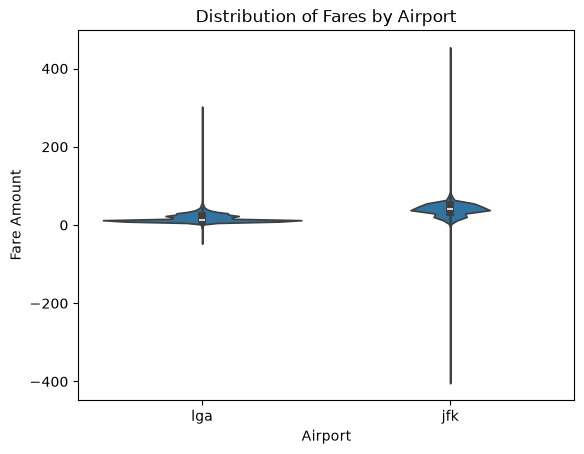

In [19]:
sns.violinplot(data=airport, x='which_airport', y='Fare_amount')

plt.xlabel('Airport')
plt.ylabel('Fare Amount')
plt.title('Distribution of Fares by Airport');

After doing an initial violin plot, it seems as though there are negative fare values in the data, which will be filtered out for the analysis.

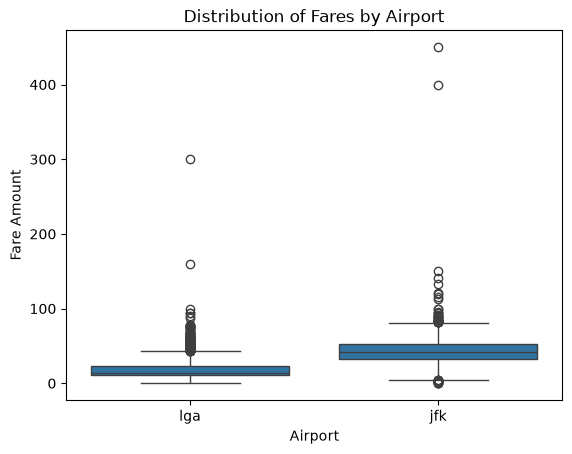

In [20]:
sns.boxplot(data=airport[airport['Fare_amount'] > 0], x='which_airport', y='Fare_amount')

plt.xlabel('Airport')
plt.ylabel('Fare Amount')
plt.title('Distribution of Fares by Airport');

It's still a little bit hard to see the distribution because of some outliers. These outliers were removed by only looking at fares under $200.

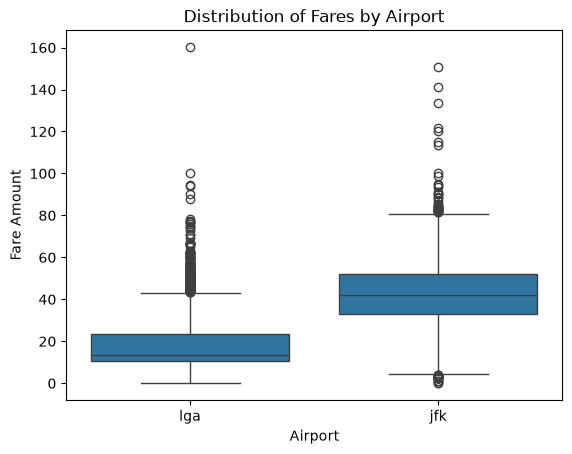

In [21]:
sns.boxplot(data=airport[(airport['Fare_amount'] > 0) & (airport['Fare_amount'] < 200)], x='which_airport', y='Fare_amount')

plt.xlabel('Airport')
plt.ylabel('Fare Amount')
plt.title('Distribution of Fares by Airport');

Looking at the distrbibution for both airports, we can see JFK fares have greater spread than LGA fares. Let's look at how the hours of the day potentially affect pricing by airport.

In [22]:
hour_airport_fare = airport.groupby(['which_airport', 'hour_of_day'], as_index=False)[['Fare_amount']].agg(
    fare_amount_mean=('Fare_amount', 'mean'),
    fare_amount_median=('Fare_amount', 'median'))

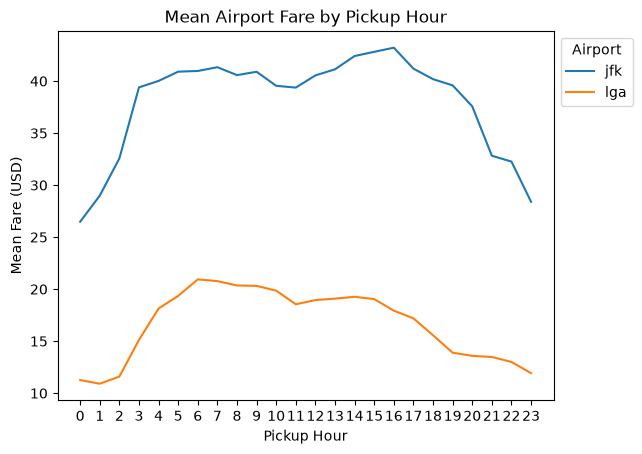

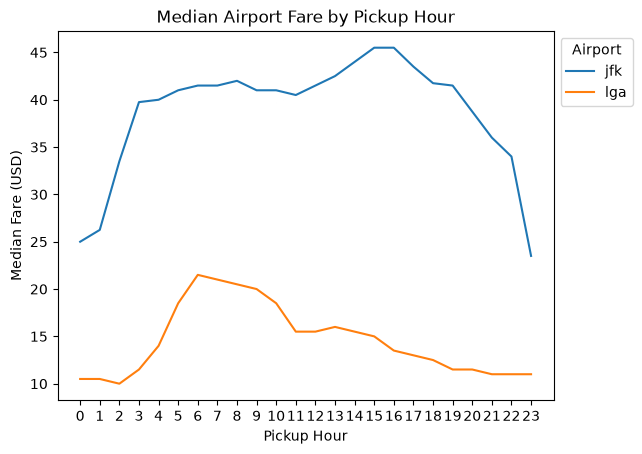

In [23]:
sns.lineplot(data=hour_airport_fare, x='hour_of_day', y='fare_amount_mean', hue='which_airport')

plt.legend(title='Airport', loc='upper left', bbox_to_anchor=(1, 1))
plt.xlabel('Pickup Hour')
plt.ylabel('Mean Fare (USD)')
plt.title('Mean Airport Fare by Pickup Hour')
plt.xticks(range(24))
plt.show()

sns.lineplot(data=hour_airport_fare, x='hour_of_day', y='fare_amount_median', hue='which_airport')
plt.legend(title='Airport', loc='upper left', bbox_to_anchor=(1, 1))
plt.xlabel('Pickup Hour')
plt.ylabel('Median Fare (USD)')
plt.title('Median Airport Fare by Pickup Hour')
plt.xticks(range(24))
plt.show();

Both mean and median fares rise around the early morning, peaking at around 6 AM for LaGuardia. However, for JFK, fares peak in the afternoon, with the average fare peaking at 5 PM and the median fare peaking at around 3 PM. These peaks could potentially correspond to the time of flights departing each airport. For instance, at JFK, many of the international flights depart mid-afternoon to early evening. For LaGuardia, since it is primarily a domestic airport, flights in the morning are of more importance for people, which could suggest why fare prices peak in the morning instead of the afternoon.

## Question 4

#### a) Build a derived variable for tip as a percentage of the total fare.

For this question, I assumed that 

$$\text{tip\_percentage} = \frac{\text{Tip Amount}}{\text{Total Amount} - \text{Tip Amount}} \times 100,$$
where total amount includes the base fare amount and additional fees paid by the rider.

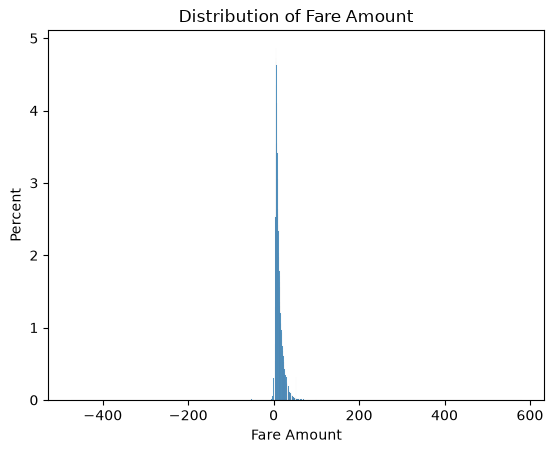

In [24]:
sns.histplot(data=data, x='Fare_amount', stat='percent')
plt.xlabel('Fare Amount')
plt.title('Distribution of Fare Amount');

From an initial scan, the data seems to have negative fares, which could correspond to refunds or discounts. These rows shouldn't be included in the model data, which will be taken into account when deriving tip percentage.

In [25]:
def tip_percentage_calc(row):
    if row['Tip_amount'] == 0:
        return 0
    elif (row['Total_amount'] - row['Tip_amount']) > 0:
        return (row['Tip_amount'] / (row['Total_amount'] - row['Tip_amount'])) * 100
    else:
        return np.nan

data['tip_percentage'] = data.apply(tip_percentage_calc, axis=1)

Let's look at how many trips had a ```NaN``` value for ```tip_percentage```.

In [26]:
nan_tip_percentage = data[data['tip_percentage'].isna() == True]
print(f"{nan_tip_percentage.shape[0]}" + " Trips")

191 Trips


Only 191 trips had ```NaN``` tip percentages. Let's explore further as to why.

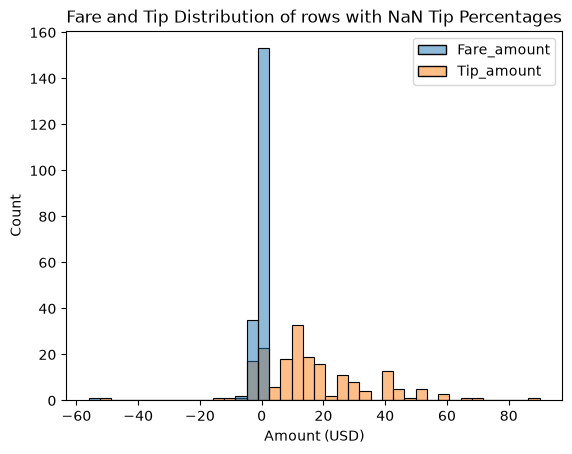

In [27]:
sns.histplot(data=nan_tip_percentage[['Fare_amount', 'Tip_amount']])
plt.xlabel('Amount (USD)')
plt.title('Fare and Tip Distribution of rows with NaN Tip Percentages')
plt.show();

The majority of the data that had a ```NaN``` tip percentage was because the fare was less than or equal to 0, resulting in an undefined tip percentage. Since these 191 trips with ```NaN``` tip percentages represent only a small portion of the data, they were removed from the analysis.

In [28]:
cleaned_data = data[data['tip_percentage'].isna() == False]

#### b) Build a predictive model for tip as a percentage of the total fare. Use as much of the data as you like (or all of it). Provide an estimate of performance using an appropriate sample, and show your work.

Since we're predicting tip percentage, the model is going to be a regression model. The plan is to develop two different models: a ```LinearRegression``` model to serve as a baseline model and an ```XGBoost``` model to help capture the non-linear trends in the data and compare which performs better.

Before developing the model, let's look at the general trend of tip percentages.

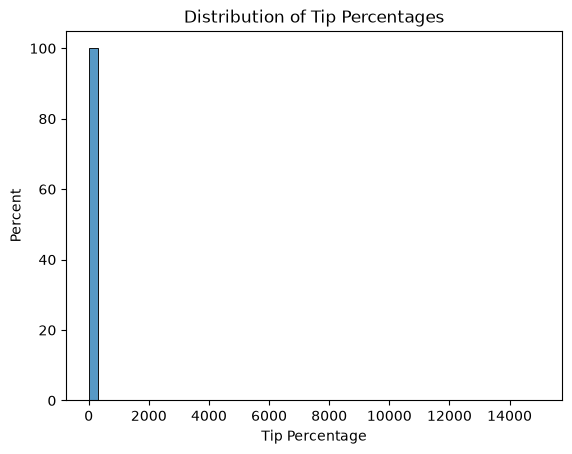

In [29]:
sns.histplot(data=cleaned_data, x='tip_percentage', stat='percent', bins=50)
plt.xlabel('Tip Percentage')
plt.title('Distribution of Tip Percentages')
plt.show();

This distribution looks really skewed, potentially due to very large outliers. Let's look into it a little bit futher, focusing on ```Fare_amount``` and ```Tip_amount```.

In [30]:
cleaned_data[cleaned_data['tip_percentage'] > 2000][['Fare_amount', 'Tip_amount']].head()

,Fare_amount,Tip_amount
3412,2.5,78.0
32335,2.5,100.0
74529,2.5,150.0
74598,2.5,150.0
88505,0.1,15.0


Looking at the data, some people had small fares with large tips larger than the total fare amount including taxes and fees. This inflates some of the tip percentages to over a 1000%, which make affect model performance. Let's look at only tip percentages of 100% or less.

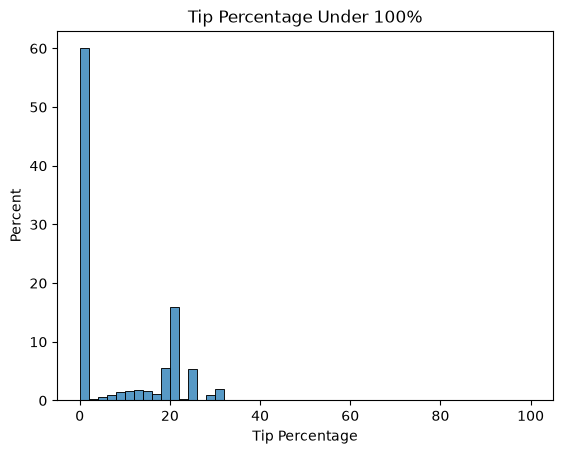

In [31]:
capped_tip_percent = cleaned_data[cleaned_data['tip_percentage'] <= 100]
sns.histplot(data=capped_tip_percent, x='tip_percentage', stat='percent', bins=50)
plt.xlabel('Tip Percentage')
plt.title('Tip Percentage Under 100%')
plt.show();

The distribution of tip percentage is concetrated around 0%, indicating that there is a large proportion of trips that have little to no tip. The distribution is heavily right-skewed, with a small number of trips having substantially higher tip percentages. Let's break it down a little further and look at hourly trends in tip percentages.

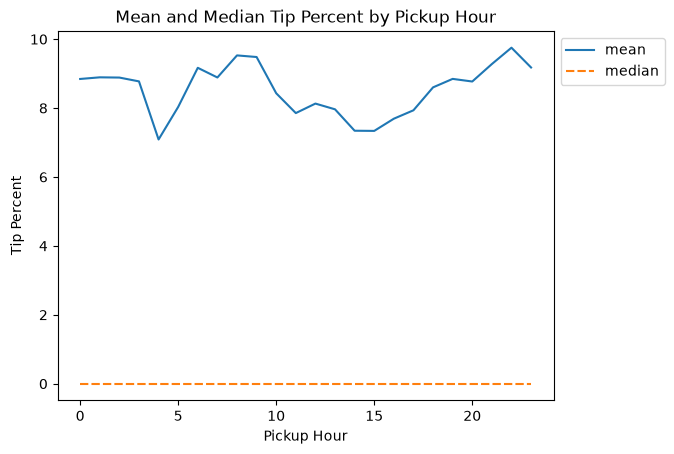

In [32]:
hourly_tips = cleaned_data.groupby('hour_of_day')['tip_percentage'].agg(['mean', 'median'])

sns.lineplot(data=hourly_tips)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xlabel('Pickup Hour')
plt.ylabel('Tip Percent')
plt.title('Mean and Median Tip Percent by Pickup Hour')
plt.show();

The median tip percent is 0 for all pick up hours of the day, suggesting that most people don't tip. The reason why the mean isn't 0 is because of the large tip percentages inflating the mean.

Now let's look at the categorical variables and see how they affect tip percentage. Let's first compare airport trips vs. non-airport trips.

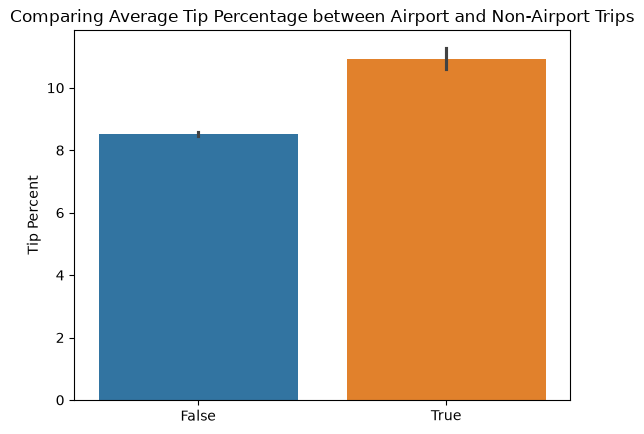

In [33]:
sns.barplot(data=cleaned_data, x='is_airport', y='tip_percentage', hue='is_airport', legend=False)
plt.xlabel('')
plt.ylabel('Tip Percent')
plt.title('Comparing Average Tip Percentage between Airport and Non-Airport Trips')
plt.show();

On average, airport trips have a higher tip percentage compared to non-airport trips, suggesting that airport trips are associated with higher tipping. Now let's look at the breakdown by airport.

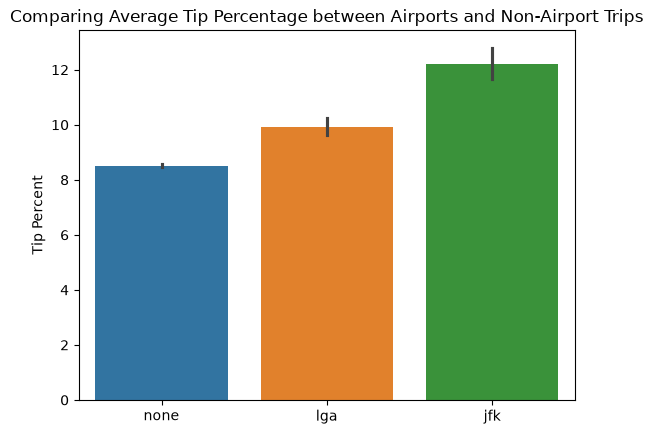

In [34]:
sns.barplot(data=cleaned_data, x='which_airport', y='tip_percentage', hue='which_airport', palette=None)
plt.xlabel('')
plt.ylabel('Tip Percent')
plt.title('Comparing Average Tip Percentage between Airports and Non-Airport Trips')
plt.show();

The graph shows that airport trips to/from JFK have a higher tip percentage on average than LaGuardia. Let's break it down by hour to see any difference.

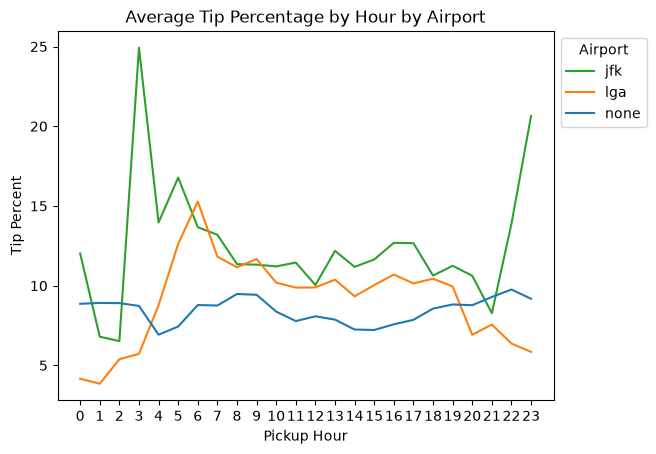

In [35]:
hourly_airport_tips = cleaned_data.groupby(['hour_of_day', 'which_airport'])['tip_percentage'].mean().reset_index()

sns.lineplot(
    data=hourly_airport_tips, 
    x='hour_of_day', 
    y='tip_percentage', 
    hue='which_airport',
    palette={
        'jfk': sns.color_palette()[2],
        'lga': sns.color_palette()[1],
        'none': sns.color_palette()[0]
    }       
)

plt.legend(title='Airport', loc='upper left', bbox_to_anchor=(1, 1))
plt.xlabel('Pickup Hour')
plt.ylabel('Tip Percent')
plt.title('Average Tip Percentage by Hour by Airport')
plt.xticks(range(24))
plt.show();

When we break it down by hour, we can see that JFK has higher average tip percentages early in the morning and late at night, whereas LaGuardia only has higher tip percentages early in the morning. These differences suggest that airport location and pickup time may be associated with variation in tip percentage. From this analysis, the ```is_airport``` variable would potentially be helpful in the model.

Now let's do a correlation analysis for our data, first dropping non-essential columns:

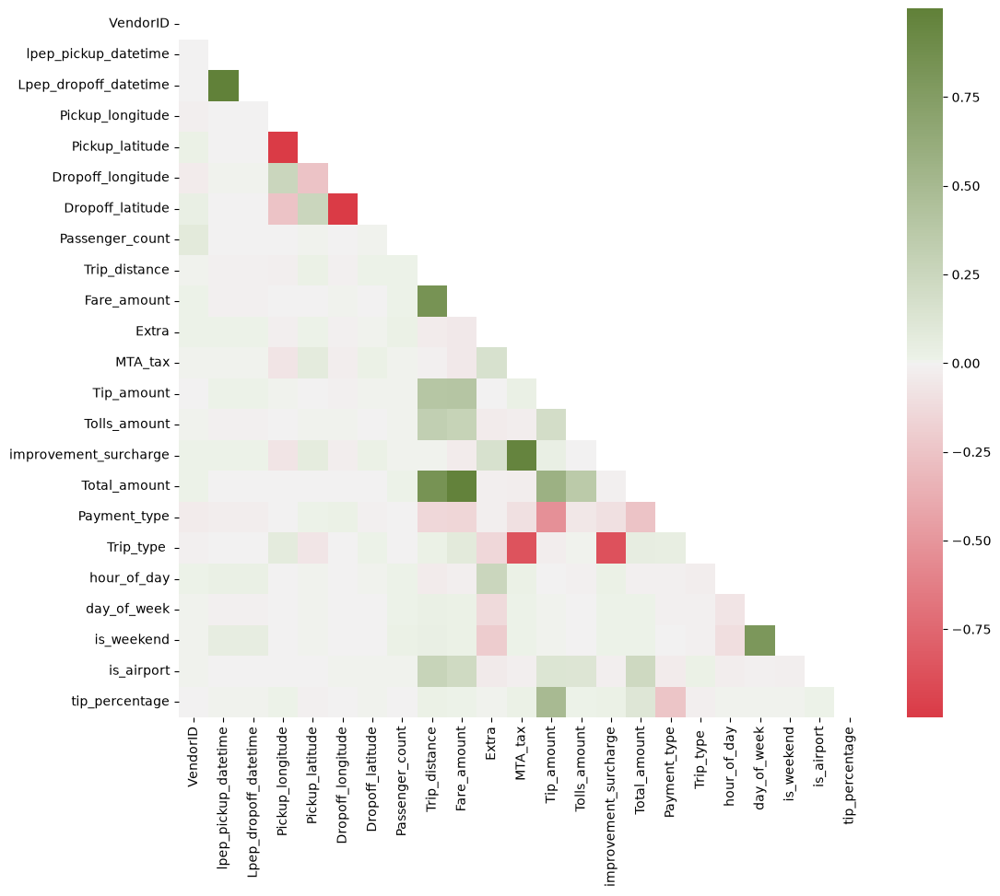

In [36]:
model_data = cleaned_data.drop(columns=['Store_and_fwd_flag', 'RateCodeID', 'which_airport', 'type'])
corr_matrix = model_data.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(10, 110, as_cmap=True)

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap=cmap, mask=mask)
plt.show();

Looking at ```Tip_amount```, we can see a large positive correlation between ```Trip_distance``` and ```Fare_amount```. However for ```tip_percentage```, those correlations aren't as strong. Additionally, we see a negative correlation for ```tip_percentage``` with ```Payment_type```. This is because the data only reports card tips, leading to all cash transactions having a 0% tip.

Now that we've looked at the correlation between the variables, let's proceed with developing the models. First, we'll start with a Linear Regression model. Before building the model, let's check if there are any nulls in the cleaned data.

In [37]:
model_data.isna().sum(axis=0)

VendorID                 0
lpep_pickup_datetime     0
Lpep_dropoff_datetime    0
Pickup_longitude         0
Pickup_latitude          0
Dropoff_longitude        0
Dropoff_latitude         0
Passenger_count          0
Trip_distance            0
Fare_amount              0
Extra                    0
MTA_tax                  0
Tip_amount               0
Tolls_amount             0
improvement_surcharge    0
Total_amount             0
Payment_type             0
Trip_type                4
hour_of_day              0
day_of_week              0
is_weekend               0
is_airport               0
tip_percentage           0
dtype: int64

There are only 4 rows where there are null values, so we'll be dropping them.

In [38]:
model_data.dropna(axis=0, inplace=True)

Next, we'll one hot encode the payment type and split our data set into train and test sets. For the first round of model development, the outliers will be kept in the data and performance will be compared by a model that isn't trained with outliers.

In [39]:
X = pd.get_dummies(data=model_data, columns= ['Payment_type'], prefix='payment_type', drop_first=True)
y = X[['tip_percentage']]

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

```Tip_amount``` and ```tip_percentage``` will be dropped from both train and test because ```tip_percentage``` can easily be derived from ```Tip_amount```. Additionally, other columns will be dropped, such as the pickup and dropoff times as they can't be used in linear regression.

In [41]:
X_train.drop(labels=['Tip_amount', 'tip_percentage', 'VendorID', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime'], axis=1, inplace=True)
X_test.drop(labels=['Tip_amount', 'tip_percentage', 'VendorID', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime'], axis=1, inplace=True) 

In [42]:
X_train.columns

Index(['Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tolls_amount', 'improvement_surcharge',
       'Total_amount', 'Trip_type ', 'hour_of_day', 'day_of_week',
       'is_weekend', 'is_airport', 'payment_type_2', 'payment_type_3',
       'payment_type_4', 'payment_type_5'],
      dtype='str')

In [43]:
X_test.columns

Index(['Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tolls_amount', 'improvement_surcharge',
       'Total_amount', 'Trip_type ', 'hour_of_day', 'day_of_week',
       'is_weekend', 'is_airport', 'payment_type_2', 'payment_type_3',
       'payment_type_4', 'payment_type_5'],
      dtype='str')

Now that the data has been partitioned, we'll do k-fold cross validation with k = 10 to assess model performance and reduce the risk of selecting a model that overfits the training data. The metrics to be used to evaluate the models will be Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and $R^2$. However, the primary evaluation metric will be MAE because it is less sensitive to extreme errors than RMSE. For each model, the reported metrics will represent the average performance across all 10 folds.

In [44]:
linear_model = LinearRegression()
kf = KFold(n_splits = 10, shuffle=True, random_state=42)

lr_results = cross_validate(
    estimator=linear_model, 
    X=X_train, 
    y=y_train, 
    cv=kf,
    scoring={
        'MAE': 'neg_mean_absolute_error',
        'RMSE': 'neg_root_mean_squared_error',
        'R2': 'r2'
    },
    return_estimator=True
)

In [45]:
model_metrics = pd.DataFrame(
    data=[['Linear Regression', -lr_results['test_MAE'].mean(), -lr_results['test_RMSE'].mean(), lr_results['test_R2'].mean()]], 
    columns=['Model', 'MAE', 'RMSE', '$R^2$']
)
model_metrics

,Model,MAE,RMSE,$R^2$
0,Linear Regression,6.451119,30.70195,0.332826


After doing an initial linear regression model, the mean $R^2$ was only 0.33, with a mean RMSE of 30.70. This means that the model is not fitting the data that well. Additionally, the RMSE is much larger than MAE which is due to the various outliers with large tip percentages we have in our data. Let's try another linear regression model, this time removing trips with tip percentage greater than 100%.

In [46]:
X_train_clean = X_train[(y_train <= 100)['tip_percentage']].copy()
y_train_clean = y_train[(y_train <= 100)['tip_percentage']].copy()

X_train_clean.shape[0]

1044858

Now there are only have 1,044,915 rows instead of 1,046,311 rows. Let's test out a new model and see if there's a difference in performance.

In [47]:
linear_model_clean = LinearRegression()
kf_clean = KFold(n_splits = 10, shuffle=True, random_state=42)

lr_results_clean = cross_validate(
    estimator=linear_model_clean, 
    X=X_train_clean, 
    y=y_train_clean, 
    cv=kf_clean,
    scoring={
        'MAE': 'neg_mean_absolute_error',
        'RMSE': 'neg_root_mean_squared_error',
        'R2': 'r2'
    },
    return_estimator=True
)

In [48]:
model_metrics.loc[len(model_metrics)] = [
    'Linear Regression, No Outliers', 
    -lr_results_clean['test_MAE'].mean(), 
    -lr_results_clean['test_RMSE'].mean(), 
    lr_results_clean['test_R2'].mean()
]
model_metrics

,Model,MAE,RMSE,$R^2$
0,Linear Regression,6.451119,30.701950,0.332826
1,"Linear Regression, No Outliers",3.132266,4.905293,0.786967


This model performes much better than the original model trained on data with outliers. The RMSE drastically decreased to 4.9, with the $R^2$ increasing to 0.78. This improvement suggests that the outliers were affecting model performance.

Now, let's try a similar process for XGBoost, where we'll first develop a model using all of the data, and then train a new model on no outliers.

In [49]:
xgb_model = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    random_state=42
)

xgb_results = cross_validate(
    estimator=xgb_model, 
    X=X_train, 
    y=y_train, 
    cv=kf,
    scoring={
        'MAE': 'neg_mean_absolute_error',
        'RMSE': 'neg_root_mean_squared_error',
        'R2': 'r2'
    }
)

In [50]:
model_metrics.loc[len(model_metrics)] = [
    'XGBoost', 
    -xgb_results['test_MAE'].mean(), 
    -xgb_results['test_RMSE'].mean(), 
    xgb_results['test_R2'].mean()
]
model_metrics

,Model,MAE,RMSE,$R^2$
0,Linear Regression,6.451119,30.701950,0.332826
1,"Linear Regression, No Outliers",3.132266,4.905293,0.786967
2,XGBoost,0.898621,20.607671,0.675017


Using XGBoost led to a large improvement of our $R^2$, MAE, and RMSE when comparing metrics to the original regression model with outliers. However, its performance is not as good as when the outliers were removed. Let's see how the model's performance changes without outliers.

In [51]:
xgb_model_clean = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    random_state=42
)

xgb_results_clean = cross_validate(
    estimator=xgb_model_clean, 
    X=X_train_clean, 
    y=y_train_clean, 
    cv=kf_clean,
    scoring={
        'MAE': 'neg_mean_absolute_error',
        'RMSE': 'neg_root_mean_squared_error',
        'R2': 'r2'
    }
)

In [52]:
model_metrics.loc[len(model_metrics)] = [
    'XGBoost, No Outliers', 
    -xgb_results_clean['test_MAE'].mean(), 
    -xgb_results_clean['test_RMSE'].mean(), 
    xgb_results_clean['test_R2'].mean()
]
model_metrics

,Model,MAE,RMSE,$R^2$
0,Linear Regression,6.451119,30.701950,0.332826
1,"Linear Regression, No Outliers",3.132266,4.905293,0.786967
2,XGBoost,0.898621,20.607671,0.675017
3,"XGBoost, No Outliers",0.670106,1.449870,0.981387


After removing the outliers, the XGBoost model also improves dramatically, having an average $R^2$ value of almost 0.98, with average RMSE also decreasing to only 1.45. This suggests that the outliers were drastically impacting model performance. However, in the test set, outliers were not removed to  mimic real world data as much as possible. Now knowing how much the outliers affect model performance, the best metric to evaluate model performance would me the MAE as it is less sensitive to outliers than the RMSE.

Let's optimize the hyperparameters of the XGBoost model and see the performance on the test set.

In [53]:
param_grid = {
    'n_estimators': [300, 500, 800, 1000],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 6, 10],
    'subsample': [0.5, 0.8, 1.0],
    'colsample_bytree': [0.5, 0.8, 1.0]
}

random_search = RandomizedSearchCV(
    estimator=XGBRegressor(random_state=42, n_jobs=1),
    param_distributions=param_grid,
    n_iter=20,
    scoring='neg_mean_absolute_error',
    cv=kf_clean,
    random_state=42,
    n_jobs=4
)

random_search.fit(X_train_clean, y_train_clean)

,"estimator estimator: estimator objectAn object of that type is instantiated for each grid point.This is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.","XGBRegressor(...ree=None, ...)"
,"param_distributions param_distributions: dict or list of dictsDictionary with parameters names (`str`) as keys and distributionsor lists of parameters to try. Distributions must provide a ``rvs``method for sampling (such as those from scipy.stats.distributions).If a list is given, it is sampled uniformly.If a list of dicts is given, first a dict is sampled uniformly, andthen a parameter is sampled using that dict as above.","{'colsample_bytree': [0.5, 0.8, ...], 'learning_rate': [0.01, 0.05, ...], 'max_depth': [3, 6, ...], 'n_estimators': [300, 500, ...], ...}"
,"n_iter n_iter: int, default=10Number of parameter settings that are sampled. n_iter tradesoff runtime vs quality of the solution.",20
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.If None, the estimator's score method is used.",'neg_mean_absolute_error'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",4
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",KFold(n_split... shuffle=True)
,"random_state random_state: int, RandomState instance or None, default=NonePseudo random number generator state used for random uniform samplingfrom lists of possible values instead of scipy.stats distributions.Pass an int for reproducible output across multiplefunction calls.See :term:`Glossary <random_state>`.",42
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given the ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` dir

In [54]:
print(random_search.best_params_)
print(-random_search.best_score_)

{'subsample': 1.0, 'n_estimators': 800, 'max_depth': 10, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
0.18238361775875092


In [55]:
xgb_model_best = XGBRegressor(
    n_estimators=800,
    learning_rate=0.1,
    max_depth=10,
    random_state=42   
)

xgb_results_best = cross_validate(
    estimator=xgb_model_best, 
    X=X_train_clean, 
    y=y_train_clean, 
    cv=kf_clean,
    scoring={
        'MAE': 'neg_mean_absolute_error',
        'RMSE': 'neg_root_mean_squared_error',
        'R2': 'r2'
    }
)

In [57]:
model_metrics.loc[len(model_metrics)] = [
    'Optimized XGBoost', 
    -xgb_results_best['test_MAE'].mean(), 
    -xgb_results_best['test_RMSE'].mean(), 
    xgb_results_best['test_R2'].mean()
]
model_metrics

,Model,MAE,RMSE,$R^2$
0,Linear Regression,6.451119,30.701950,0.332826
1,"Linear Regression, No Outliers",3.132266,4.905293,0.786967
2,XGBoost,0.898621,20.607671,0.675017
3,"XGBoost, No Outliers",0.670106,1.449870,0.981387
4,Optimized XGBoost,0.182384,0.825006,0.993971


From the optimized XGBoost model, while the RMSE decreases slightly and the $R^2$ increases slightly compared to the XGBoost with no outliers, the MAE decreased on a larger scale in comparison. Let's use the optimized model on the unfiltered test set and measure its performance.

In [58]:
optimized_xgb = random_search.best_estimator_
optimized_xgb

,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API <callback_api>`... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,1.0
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes from sklearn.metrics import mean_absolute_error X, y = load_diabetes(return_X_y=True) reg = xgb.XGBRegressor( tree_method=""hist"", eval_metric=mean_absolute_error, ) reg.fit(X, y, eval_set=[(X, y)])",None
,feature_types feature_types: typing.Optional[typing.Sequence[str]].. versionadded:: 1.7.0Used for specifying feature types without constructing a dataframe. Seethe :py:class:`DMatrix` for details.,None


In [61]:
y_pred = optimized_xgb.predict(X_test)
mae_true = mean_absolute_error(y_test, y_pred)
rmse_true = mean_squared_error(y_test, y_pred) ** 0.5
r2_true = r2_score(y_test, y_pred)

final_model_metrics = pd.DataFrame(
    data=[['Unfiltered Test Set', mae_true, rmse_true, r2_true]], 
    columns=['Model', 'MAE', 'RMSE', '$R^2$']
)
final_model_metrics

,Model,MAE,RMSE,$R^2$
0,Unfiltered Test Set,0.592218,24.696496,0.315396


On the unfiltered test data with outliers, the model has a relatively small MAE compared to the RMSE, with only 0.59 compared to 24.696, indicating that large prediction errors are disproportionately affecting the RMSE.

One interesting observation is that, while the RMSE was higher and its $R^2$ is lower than the original XGBoost model with no data modifications, the MAE was considerably lower. This suggests that the optimized model's predictions were, on average, closer to the actual tip percentages. However, the higher RMSE indicates that the model is making some large errors, which appear to be associated with the extreme tip percentages in the data. 

Overall, the optimized XGBoost model performs relatively well when using MAE as the main model metric on the test data.

To further examine how extreme observations are affecting model performance, let's test out the optimized XGBoost model on the test set where outliers are filtered out.

In [62]:
X_test_clean = X_test[y_test['tip_percentage'] <= 100]
y_test_clean = y_test[y_test['tip_percentage'] <= 100]

y_pred_clean = optimized_xgb.predict(X_test_clean)
mae_clean = mean_absolute_error(y_test_clean, y_pred_clean)
rmse_clean = mean_squared_error(y_test_clean, y_pred_clean) ** 0.5
r2_clean = r2_score(y_test_clean, y_pred_clean)

final_model_metrics.loc[len(model_metrics)] = [
    'Filtered Test Set', 
    mae_clean, 
    rmse_clean, 
    r2_clean
]
final_model_metrics

,Model,MAE,RMSE,$R^2$
0,Unfiltered Test Set,0.592218,24.696496,0.315396
5,Filtered Test Set,0.181764,0.836184,0.993826


If the outliers are filtered from the test data, the optimized model performs the best out of all the models. The substantial improvement in model performance after removing extreme tip percentages suggests that these observations contribute disproportionately to the model's prediction error. For future modeling of the dataset, a model that is less sensitive to outliers should be considered.

## Question 5: 

#### Can you build a visualization (interactive or static) of the trip data that helps us understand intra- vs. inter-borough traffic? What story does it tell about how New Yorkers use their green taxis?

The plan is to develop an interactive Choropleth map that shows trip characteristics for each borough as well as traffic flows. This will primarily be done in GeoPandas and Plotly for interactivity.

The data on borough boundaries for the map was sourced from the [NYC Department of City Planning Website](https://www.nyc.gov/content/planning/pages/resources/datasets/borough-boundaries).

In [37]:
boroughs = gpd.read_file('data/borough_data/nybb.shp')
boroughs.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,325912.288988,1.623618e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,3,Brooklyn,726953.045094,1.934463e+09,"MULTIPOLYGON (((1022227.32 152028.146, 1022078..."
2,4,Queens,887902.903727,3.041420e+09,"MULTIPOLYGON (((1032452.015 154469.237, 103245..."
3,1,Manhattan,359538.581592,6.366406e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,463146.326689,1.187199e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


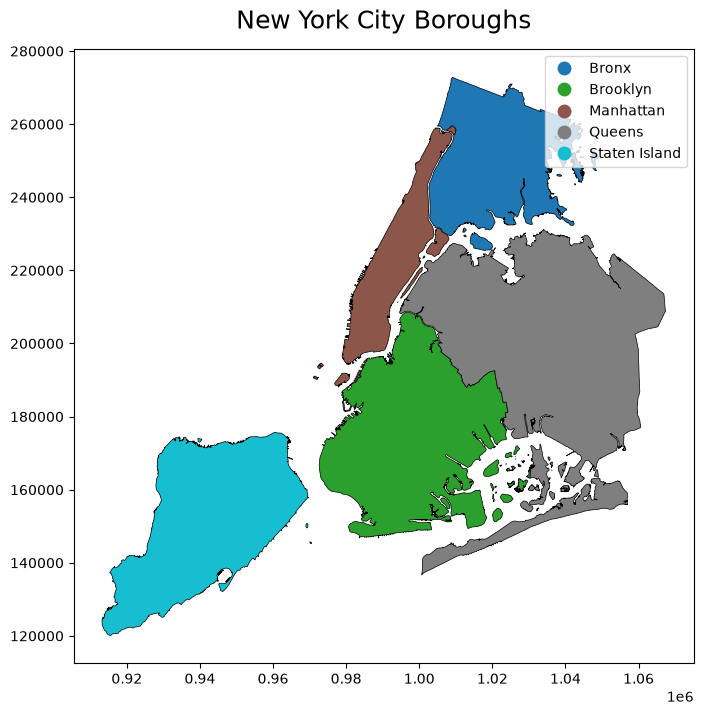

In [38]:
fig, ax = plt.subplots(figsize=(8, 8))

boroughs.plot(ax=ax, column='BoroName', legend=True, edgecolor='black', linewidth=0.5)

ax.set_title('New York City Boroughs', fontsize=18,pad=15);

In [39]:
boroughs.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

First, the borough coordinate data has to be converted to match the coordinate formats from the taxi data. Then, the borough data will be joined to the taxi data to locate which borough the pickup and dropoff locations were in.

In [40]:
boroughs_4326 = boroughs.to_crs('EPSG:4326')

In [41]:
pickup_gdf = gpd.GeoDataFrame(
    data=data, 
    geometry=gpd.points_from_xy(
        data['Pickup_longitude'],
        data['Pickup_latitude']
    ),
    crs='EPSG:4326'
)

dropoff_gdf = gpd.GeoDataFrame(
    data=data,
    geometry=gpd.points_from_xy(
        data['Dropoff_longitude'],
        data['Dropoff_latitude']
    ),
    crs='EPSG:4326'
)

data = gpd.sjoin(
    pickup_gdf,
    boroughs_4326[['BoroName', 'geometry']],
    how='left',
    predicate='within'
)

data.rename(columns={'BoroName' : 'pickup_borough'}, inplace=True)
data.drop(columns=['index_right', 'geometry'], inplace=True)

dropoff_gdf = gpd.sjoin(
    dropoff_gdf,
    boroughs_4326[['BoroName', 'geometry']],
    how='left',
    predicate='within'
)

data = pd.concat([data, dropoff_gdf['BoroName']], axis=1)
data.rename(columns={'BoroName' : 'dropoff_borough'}, inplace=True)
data[['pickup_borough', 'dropoff_borough']].head()

,pickup_borough,dropoff_borough
0,Brooklyn,Brooklyn
1,NaN,NaN
2,Queens,Queens
3,Queens,Queens
4,Brooklyn,Brooklyn


From looking at the head of the table, we can see ```NaN``` being a potential value for some of the trips. After investigating some entries, some of these ```NaN``` values are because these trips took place outside the NYC boroughs. For instance, one trip occured within New Jersey while another trip occured from Manhattan to Yonkers. Let's look at how many entries have ```NaN``` values.

In [42]:
data[['pickup_borough', 'dropoff_borough']].isna().sum()

pickup_borough     3161
dropoff_borough    7244
dtype: int64

Since there are not that many null values, we'll be filtering them out. Using the filtered table, we'll do a cross tabulation to get an idea of the percentage of rides from borough to borough.

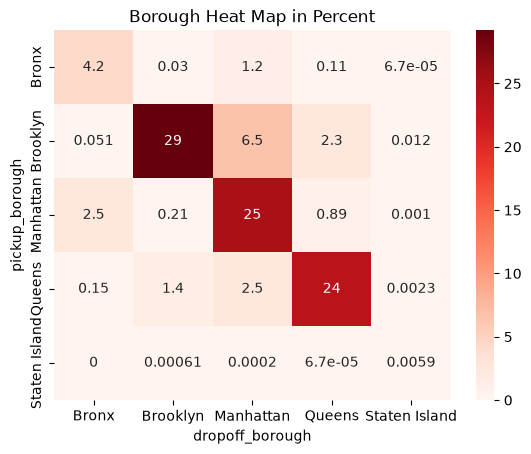

In [43]:
filtered_boroughs = data[(data['pickup_borough'].isna() == False) & (data['dropoff_borough'].isna() == False)]
boroughs_crosstab = pd.crosstab(filtered_boroughs['pickup_borough'], filtered_boroughs['dropoff_borough'], normalize=True)
sns.heatmap(boroughs_crosstab * 100, cmap='Reds', annot=True)
plt.title('Borough Heat Map in Percent');

Looking at this heatmap, we can see most of the trips occurs intra-borough, with the most of the trips occuring intra-Brooklyn. From here, we'll develop the choropleth to help visualize the taxi traffic flows and some key statistics about each flow. For this, we'll be using Plotly to allow for interactivity.

We'll start with adding new columns to the data, such as the trip length, and get the aggregate values for some features.

In [44]:
filtered_boroughs['day_of_week'] = filtered_boroughs['lpep_pickup_datetime'].dt.day_name()
filtered_boroughs['ride_length_min'] = (filtered_boroughs['Lpep_dropoff_datetime'] - filtered_boroughs['lpep_pickup_datetime']).dt.total_seconds() / 60
filtered_boroughs['pickup_time_hour'] = filtered_boroughs['lpep_pickup_datetime'].dt.hour

In [45]:
borough_flows = (
    filtered_boroughs
    .groupby(['pickup_borough', 'dropoff_borough'])
    .agg(
        avg_distance=('Trip_distance', 'mean'),
        avg_fare=('Fare_amount', 'mean'),
        avg_tip_percentage=('tip_percentage', 'mean'),
        avg_pax=('Passenger_count', 'mean'),
        trip_count=('pickup_borough', 'size'),
        most_frequent_day=('day_of_week', lambda x: x.mode().iloc[0]),
        avg_ride_duration=('ride_length_min', 'mean'),
        most_frequent_pickup_hour=('pickup_time_hour', lambda x: x.mode().iloc[0])
    ).reset_index()
)

borough_centers = boroughs_4326.copy()
borough_centers['center'] = borough_centers.geometry.representative_point()
borough_centers['lon'] = borough_centers.center.x
borough_centers['lat'] = borough_centers.center.y
borough_coords = borough_centers.set_index('BoroName')[['lon', 'lat']]

intra_borough = borough_flows[borough_flows['pickup_borough'] == borough_flows['dropoff_borough']]

In [46]:
borough_flows.head()

,pickup_borough,dropoff_borough,avg_distance,avg_fare,avg_tip_percentage,avg_pax,trip_count,most_frequent_day,avg_ride_duration,most_frequent_pickup_hour
0,Bronx,Bronx,2.131322,9.947510,3.520659,1.319457,63082,Friday,17.481114,17
1,Bronx,Brooklyn,16.683596,50.802247,9.903816,1.379775,445,Saturday,51.006255,22
2,Bronx,Manhattan,4.409261,16.510171,5.330188,1.316709,18487,Saturday,25.852870,16
3,Bronx,Queens,11.080948,34.849359,8.099679,1.371557,1561,Friday,31.943348,22
4,Bronx,Staten Island,34.300000,50.000000,0.000000,3.000000,1,Wednesday,99.983333,15


Next, helper functions for the map visualizations will be used.

In [47]:
def curved_line(lon1, lat1, lon2, lat2, curve=0.15, n=50):
    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    
    dx = lon2 - lon1
    dy = lat2 - lat1

    perp_lon = -dy
    perp_lat = dx

    length = np.sqrt(perp_lon**2 + perp_lat**2)

    perp_lon /= length
    perp_lat /= length

    control_lon = mid_lon + perp_lon * curve
    control_lat = mid_lat + perp_lat * curve

    t = np.linspace(0, 1, n)

    lon = (
        (1 - t)**2 * lon1
        + 2 * (1 - t) * t * control_lon
        + t**2 * lon2
    )

    lat = (
        (1 - t)**2 * lat1
        + 2 * (1 - t) * t * control_lat
        + t**2 * lat2
    )

    return lon, lat

def calculate_angle(lon1, lat1, lon2, lat2):
    return np.degrees(np.arctan2(lon2 - lon1, lat2 - lat1))

Here, we'll define what color corresponds to which borough.

In [48]:
borough_colors = {
    'Bronx': '#AA8F66',
    'Brooklyn': '#ED9B40',
    'Manhattan': '#49393B',
    'Queens': '#61C9A8',
    'Staten Island': '#BA3B46'
}

Lastly, we'll develop the choropleth map, allowing hovering functionality.

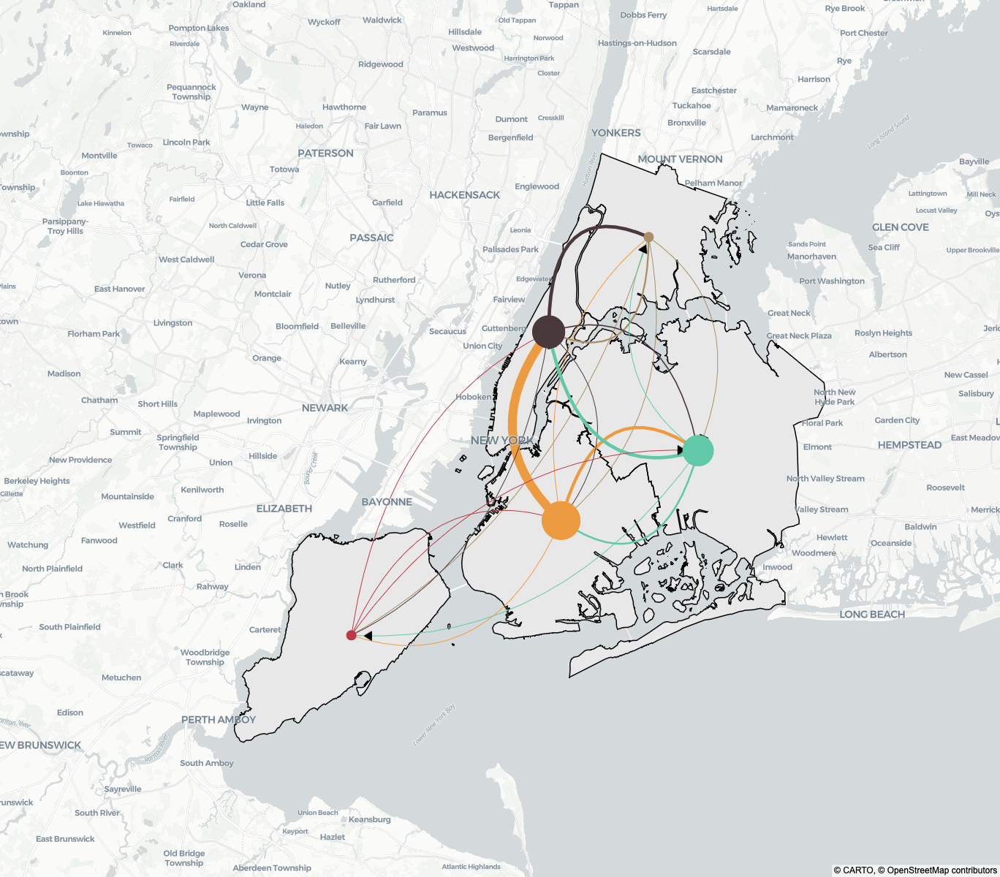

In [54]:
borough_geojson = json.loads(boroughs_4326.to_json())

fig = go.Figure(
    go.Choroplethmap(
        geojson=borough_geojson,
        locations=boroughs_4326['BoroName'],
        z=[1, 1, 1, 1, 1],
        featureidkey='properties.BoroName',
        colorscale=[[0, '#E8E8E8'], [1, '#E8E8E8']],
        showscale=False,
        marker_line_color='black',
        marker_line_width=1.5
    )
)

for _, row in borough_flows.iterrows():
    pickup = row['pickup_borough']
    dropoff = row['dropoff_borough']
    trips = row['trip_count']

    if trips == 0 or pickup == dropoff:
        continue
    lon1 = borough_coords.loc[pickup, 'lon']
    lat1 = borough_coords.loc[pickup, 'lat']
    lon2 = borough_coords.loc[dropoff, 'lon']
    lat2 = borough_coords.loc[dropoff, 'lat']
    
    lons, lats = curved_line(lon1, lat1, lon2, lat2, curve=0.08)

    fig.add_trace(
        go.Scattermap(
            lon=lons,
            lat=lats,
            mode='lines',
            line=dict(width=max(1, trips / 8000), color=borough_colors[pickup]),
            name=f'{pickup} → {dropoff}',
            hovertemplate=(
                f"<b>{pickup} → {dropoff}</b><br>"
                f"Trips: {trips:,}<br>"
                f"Avg. Distance: {row['avg_distance']:.2f} mi<br>"
                f"Avg. Fare: ${row['avg_fare']:.2f}<br>"
                f"Avg. Tip: {row['avg_tip_percentage']:.2f}%<br>"
                f"Avg. Passengers: {row['avg_pax']:.2f}<br>"
                f"Most Frequent Day: {row['most_frequent_day']}<br>"
                f"Most Frequent Pickup Hour: {row['most_frequent_pickup_hour']}:00<br>"
                f"Avg. Ride Duration: {row['avg_ride_duration']:.2f} min<br>"
                "<extra></extra>"
            ),
            showlegend=False
        )
    )
    arrow_lon = lons[-3]
    arrow_lat = lats[-3]

    angle = calculate_angle(lons[-4], lats[-4], lons[-3], lats[-3])

    fig.add_trace(
        go.Scattermap(
            lon=[arrow_lon],
            lat=[arrow_lat],
            mode='markers',
            marker=dict(size=10, symbol='triangle', angle=angle, color='red'),
            showlegend=False,
            hoverinfo='skip'
        )
    )

for _, row in intra_borough.iterrows():

    borough = row['pickup_borough']
    trips = row['trip_count']

    if trips == 0:
        continue

    lon = borough_coords.loc[borough, 'lon']
    lat = borough_coords.loc[borough, 'lat']

    fig.add_trace(
        go.Scattermap(
            lon=[lon],
            lat=[lat],
            mode='markers',
            marker=dict(
                size=max(15, trips / 8000),
                color=borough_colors[borough]
            ),
            name=f'{borough} → {borough}',
            hovertemplate=(
                f"<b>{borough} → {borough}</b><br>"
                f"Trips: {trips:,}<br>"
                f"Avg. Distance: {row['avg_distance']:.2f} mi<br>"
                f"Avg. Fare: ${row['avg_fare']:.2f}<br>"
                f"Avg. Tip: {row['avg_tip_percentage']:.2f}%<br>"
                f"Avg. Passengers: {row['avg_pax']:.2f}<br>"
                f"Most Frequent Day: {row['most_frequent_day']}<br>"
                f"Most Frequent Pickup Hour: {row['most_frequent_pickup_hour']}<br>:00"
                f"Avg. Ride Duration: {row['avg_ride_duration']:.2f} min<br>"
                "<extra></extra>"
            ),
            showlegend=False
        )
    )

fig.update_layout(width=1200, height=1200, map=dict(style='carto-positron', center=dict(lat=40.7128,lon=-74.0060), zoom=10), margin=dict(l=0, r=0, t=0, b=0))
fig.write_html("visualization/borough_traffic_flow.html", include_plotlyjs=True)
fig.show()

**How to read the map:** Inter-borough trips are shown as directional arrows, whereas intra-borough trips are represented by points inside the borough. Hovering over a flow provides additional information about the trips, including average distance, fare, tip percentage, and the most frequent day taxis are taken.

In [76]:
print('Intra-borough percent:', (sum(intra_borough['trip_count'] / filtered_boroughs.shape[0]) * 100))
print('Inter-borough percent:', ((sum(borough_flows['trip_count']) - sum(intra_borough['trip_count'])) / filtered_boroughs.shape[0]) * 100)

Intra-borough percent: 82.06003949860732
Inter-borough percent: 17.939960501392683


The visualization shows that taxi traffic is heavily concentrated in intra-borough traffic, accounting for over 80% of rides taken, with Brooklyn having the most trips, followed by Manhattan, Queens, then the Bronx and Staten Island. The most frequent days for borough-to-borough trips were taken were on weekends, particularly on Saturdays. Overall, the data suggest that most green taxi trips are relatively short distances and remain within the same borough, implying that green taxis primarily serve local transportation needs, potentially as an alternative to public transit. 